In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

In [3]:
X_train = pd.read_csv('C:/Users/dines/OneDrive/Documents/Training Data/Linear_X_Train.csv')
Y_train = pd.read_csv('C:/Users/dines/OneDrive/Documents/Training Data/Linear_Y_Train.csv')

In [4]:
X_train.head(5)

,x
0,-0.289307
1,-0.588810
2,1.027507
3,-0.259013
4,0.782043


In [5]:
Y_train

,y
0,-0.091101
1,-53.467721
2,75.457009
3,-12.025286
4,57.414187
...,...
3745,-13.530595
3746,114.741657
3747,-34.983275
3748,145.206092


In [6]:
X_train.describe()

,x
count,3750.000000
mean,-0.037795
std,0.992212
min,-3.546299
25%,-0.698443
50%,-0.035028
75%,0.629425
max,4.091393


#### Normalise the dataset


In [7]:
u = X_train.mean()
std = X_train.std()
X_train = (X_train - u)/std
X_train.describe()

,x
count,3.750000e+03
mean,-1.037985e-16
std,1.000000e+00
min,-3.536042e+00
25%,-6.658332e-01
50%,2.788868e-03
75%,6.724564e-01
max,4.161596e+00


In [8]:
X = X_train.values
Y = Y_train.values

Visualising the data

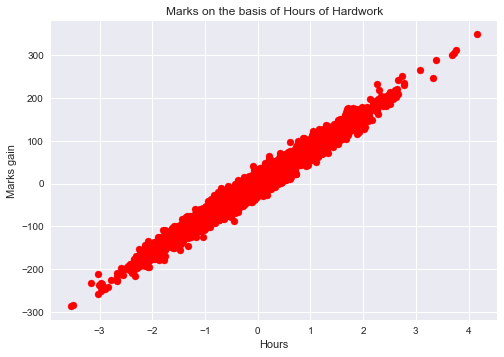

In [9]:
plt.style.use('seaborn')
plt.scatter(X,Y,color = 'red')
plt.xlabel("Hours")
plt.ylabel('Marks gain')
plt.title("Marks on the basis of Hours of Hardwork")
plt.show()

In [10]:
def hypothesis(x,theta):
    y_= theta[0]+theta[1]*x
    return y_
def gradient(X,Y,theta):
    grad = np.zeros((2,))
    m = X.shape[0]
    for i in range(m):
        x= X[i]
        y_ = hypothesis(x,theta)
        grad[0] += (y_-Y[i])
        grad[1] += (y_-Y[i])*x
    return grad/m
        
def error(X,Y,theta):
    m = X.shape[0]
    total_error = 0.0
    for i in range(m):
        y_ = hypothesis(X[i],theta)
        total_error += (y_ - Y[i])**2
    return total_error/m
        
def gradientDescent(X,Y,max_steps = 100,learning_rate = 0.1):
   
    theta = np.zeros((2,))
    error_list = []
    theta_list = []
    for i in range(max_steps):
        grad = gradient(X,Y,theta)
        e = error(X,Y,theta)
        theta[0] = theta[0] - learning_rate* grad[0]
        theta[1] = theta[1] - learning_rate*grad[1]
        error_list.append(e)
        theta_list.append((theta[0],theta[1]))
    return theta , error_list , theta_list

    

In [11]:
theta,error_list,theta_list = gradientDescent(X,Y)
theta_list

[(0.06838689680155917, 7.989508213387282),
 (0.1299351039229622, 15.180278658988195),
 (0.18532849033222432, 21.65216381390755),
 (0.2351825381005608, 27.477033036939137),
 (0.28005118109206417, 32.7195706675135),
 (0.32043295978441727, 37.43799433603389),
 (0.3567765606075347, 41.68470146233341),
 (0.3894858013483403, 45.506851121526346),
 (0.41892411801506535, 48.94688773879089),
 (0.44541860301511793, 52.04301242863878),
 (0.46926363951516553, 54.82960721282696),
 (0.49072417236520854, 57.33761682779055),
 (0.5100386519302469, 59.594892361514184),
 (0.5274216835387817, 61.626500535879686),
 (0.5430664119864629, 63.45500206902663),
 (0.5571466675893759, 65.10070220889975),
 (0.5698188976319976, 66.58187622012262),
 (0.581223904670357, 67.91497232819685),
 (0.5914884110048808, 69.1147943746932),
 (0.6007264667059523, 70.1946662117945),
 (0.6090407168369166, 71.16657966176798),
 (0.6165235419547845, 72.04132768443611),
 (0.6232580845608654, 72.82862423145137),
 (0.6293191729063385, 73.

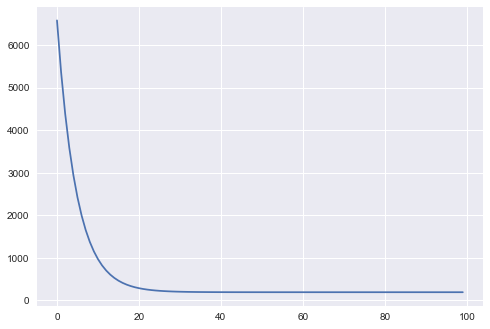

In [12]:
plt.plot(error_list)
plt.show()

In [13]:
def prediction(X,theta):
    y_ = hypothesis(X,theta)
    return y_

In [14]:
y_ = prediction(X,theta)

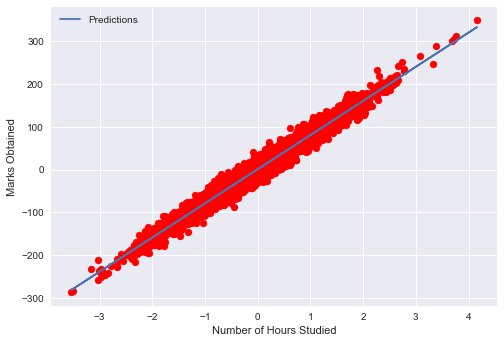

In [15]:
plt.scatter(X,Y,c='red')
plt.plot(X,y_,label = "Predictions")
plt.xlabel('Number of Hours Studied')
plt.ylabel('Marks Obtained')
plt.legend()
plt.show()

In [16]:
X_test = pd.read_csv('C:/Users/dines/OneDrive/Documents/Test Cases/Linear_X_Test.csv')

In [17]:
X_test.values

array([[-1.87794441],
       [-0.86903192],
       [-2.53018242],
       ...,
       [ 0.12800782],
       [-0.27803759],
       [-0.68042543]])

In [18]:
y_test = prediction(X_test,theta)
y_test.rename(columns={'x':'y'},inplace = True)

In [19]:
y_test.to_csv('y_prediction.csv',index = False)

In [20]:
def r2score(Y,Y_):
    num = np.sum((Y-Y_)**2)
    deno = np.sum((Y-Y.mean())**2)
    score = (1-num/deno)
    return score*100

In [21]:
r2score(Y,y_)

97.09612226930929

## Visualizing the Loss function, Gradient Descent , Theta Updates.

In [22]:
T0 = np.arange(-40,40,1)
T1 = np.arange(40,120,1)
T0,T1 = np.meshgrid(T0,T1)
m = X.shape[0]
J = np.zeros(T0.shape)
for i in range(J.shape[0]):
    for j in range(J.shape[1]):
        y_ = T1[i,j]*X+T0[i,j]
        J[i,j] = np.sum((Y-y_)**2)/m




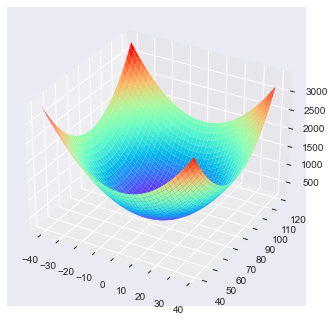

In [23]:
fig = plt.figure()
axes = fig.gca(projection = '3d')
axes.plot_surface(T0,T1,J,cmap = 'rainbow')
plt.show()

In [24]:
theta_list = np.array(theta_list)
theta_list

array([[6.83868968e-02, 7.98950821e+00],
       [1.29935104e-01, 1.51802787e+01],
       [1.85328490e-01, 2.16521638e+01],
       [2.35182538e-01, 2.74770330e+01],
       [2.80051181e-01, 3.27195707e+01],
       [3.20432960e-01, 3.74379943e+01],
       [3.56776561e-01, 4.16847015e+01],
       [3.89485801e-01, 4.55068511e+01],
       [4.18924118e-01, 4.89468877e+01],
       [4.45418603e-01, 5.20430124e+01],
       [4.69263640e-01, 5.48296072e+01],
       [4.90724172e-01, 5.73376168e+01],
       [5.10038652e-01, 5.95948924e+01],
       [5.27421684e-01, 6.16265005e+01],
       [5.43066412e-01, 6.34550021e+01],
       [5.57146668e-01, 6.51007022e+01],
       [5.69818898e-01, 6.65818762e+01],
       [5.81223905e-01, 6.79149723e+01],
       [5.91488411e-01, 6.91147944e+01],
       [6.00726467e-01, 7.01946662e+01],
       [6.09040717e-01, 7.11665797e+01],
       [6.16523542e-01, 7.20413277e+01],
       [6.23258085e-01, 7.28286242e+01],
       [6.29319173e-01, 7.35372121e+01],
       [6.347741

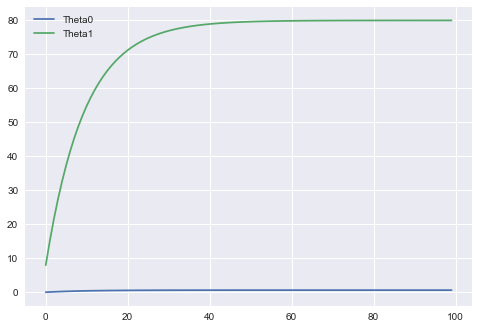

In [25]:
plt.plot(theta_list[:,0],label = 'Theta0')
plt.plot(theta_list[:,1],label = 'Theta1')
plt.legend()
plt.show()


### Trajectory traced by theta updates

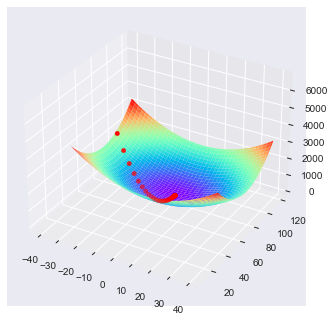

In [26]:
fig = plt.figure()
axes = fig.gca(projection = '3d')
axes.plot_surface(T0,T1,J,cmap = 'rainbow')
axes.scatter(theta_list[:,0],theta_list[:,1],error_list,color = 'red')
plt.show()

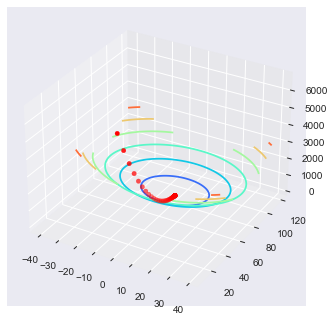

In [27]:
fig = plt.figure()
axes = fig.gca(projection = '3d')
axes.contour(T0,T1,J,cmap = 'rainbow')
axes.scatter(theta_list[:,0],theta_list[:,1],error_list,color = 'red')
plt.show()

### 2-D contour

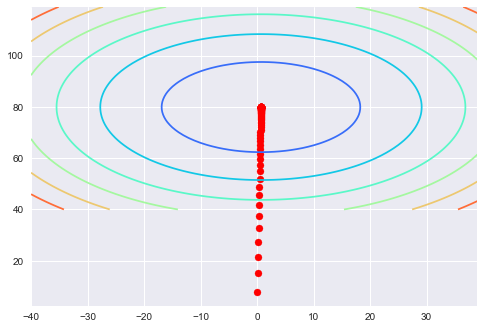

In [28]:
plt.contour(T0,T1,J,cmap = 'rainbow')
plt.scatter(theta_list[:,0],theta_list[:,1],color = 'red')
plt.show()

In [29]:
# save the data in file.
np.save('Thetafile.npy',theta_list)

In [30]:
theta = np.load('Thetafile.npy')

In [31]:
T0=theta[:,0]
T1 = theta[:,1]


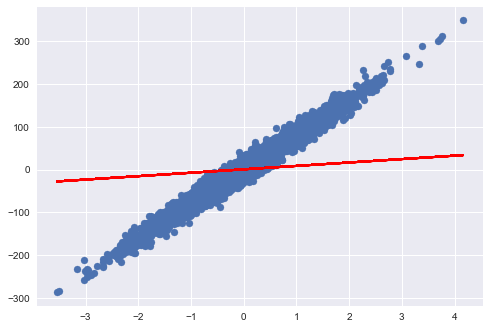

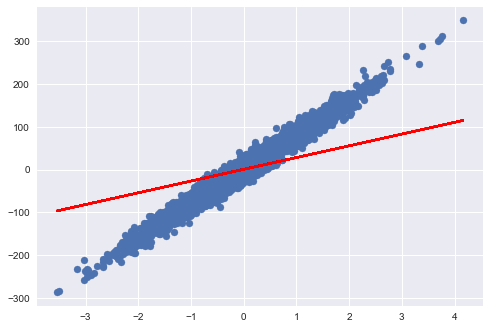

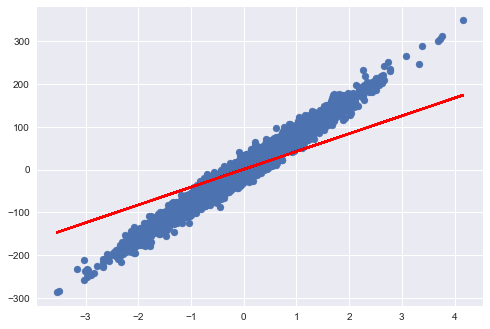

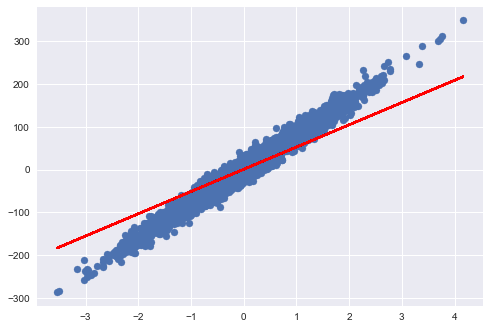

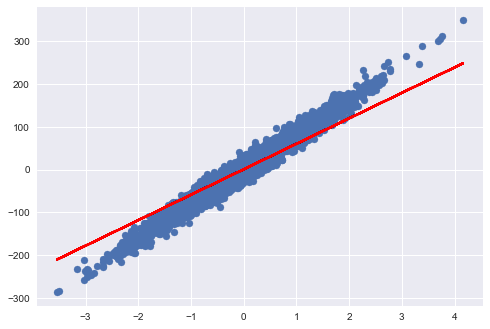

...

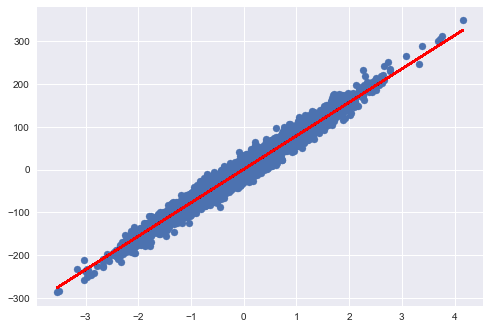

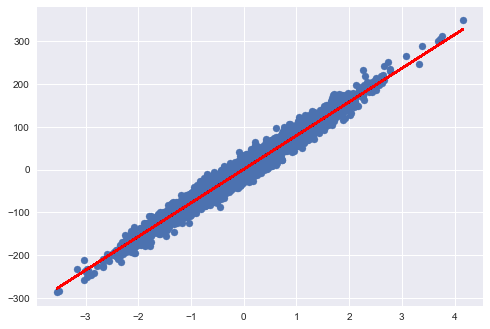

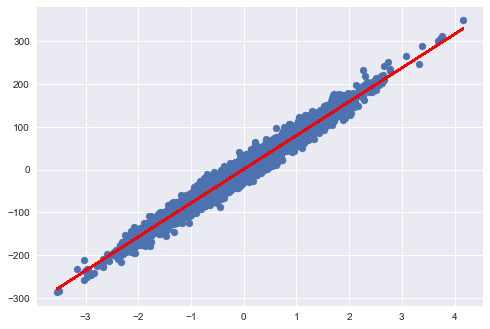

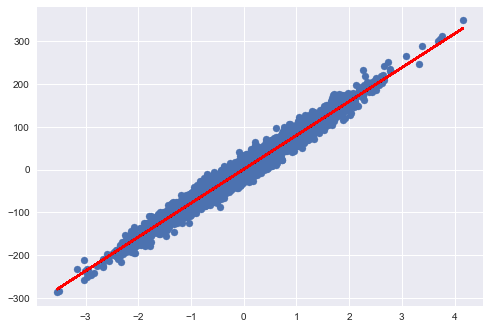

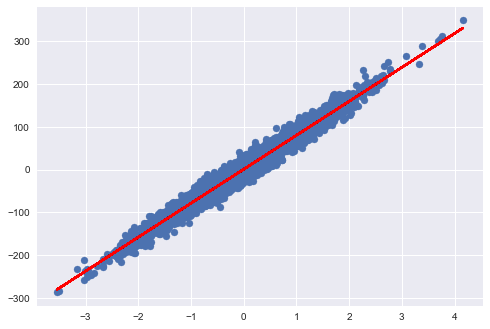

<Figure size 576x396 with 0 Axes>

In [32]:
plt.ion
for i in range(0,50,3):
    y_ = T1[i]*X + T0
    #points
    plt.scatter(X,Y)
    plt.plot(X,y_,'red')
    plt.draw()
    plt.pause(1)
    plt.clf()
    
    